## Import packages

In [0]:
# Install the OpenSlide C library and Python bindings
!apt-get install openslide-tools
!pip install openslide-python

Reading package lists... Done
Building dependency tree       
Reading state information... Done
openslide-tools is already the newest version (3.4.1+dfsg-2).
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
0 upgraded, 0 newly installed, 0 to remove and 7 not upgraded.


In [0]:
%tensorflow_version 2.x
import tensorflow as tf

In [0]:
from tensorflow.keras.layers import Dense, Embedding, Flatten, Input, LSTM, Conv2D, MaxPooling2D,AveragePooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import datasets, layers, models
import sklearn
from sklearn.model_selection import train_test_split
from keras import optimizers
from keras import backend as K
from keras.models import load_model
from keras.layers.normalization import BatchNormalization

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from openslide import open_slide, __library_version__ as openslide_version
import os
from PIL import Image
from skimage.color import rgb2gray
import random
import math

## Create and store the path of the images, which are stored on my gdrive. I've excluded image 91 so that I can use it in testing

In [0]:
numbers = ['001','002','005','012','016','019','023','031','035','057','059','064','075','078','081','084','094','096','101','110']

slides = []
for num in numbers:
  slide = 'Copy of tumor_'+num+'.tif'
  slide_path = '/content/drive/My Drive/slid/%s' % slide
  slides.append(slide_path)
masks = []
for num in numbers:
  mask = 'Copy of tumor_'+num+'_mask.tif'
  mask_path = '/content/drive/My Drive/slid/%s' % mask
  masks.append(mask_path)

## Mount the drive where my images are store

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## read_slide function, used to read the images and windows/ patches

In [0]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
def read_slide(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    if as_float:
        im = np.asarray(im, dtype=np.float32)
    else:
        im = np.asarray(im)
    assert im.shape == (height, width, 3)
    return im

## How many of the images in the dataset do not contain cancer?


In [0]:
#how many images in the dataset have no cancer
count = 0
for i in masks:
  mask = open_slide(i)
  mask_image = read_slide(mask,x=0,y=0,level = 7, width=mask.level_dimensions[7][0], height=mask.level_dimensions[7][1])
  if np.count_nonzero(mask_image) > 0:
    count = count + 1
count - len(masks)

0

## Randomly split the dataset so that I have two additional testing images (3 in total counting 091)

In [0]:
slides_and_mask = []
for i in range(len(slides)):
  slides_and_mask.append((slides[i],masks[i]))
random.shuffle(slides_and_mask)
split = 18 # 2 testing images, he requires 3 and I'm using 91 as one of my test images
training_slide_paths, testing_slide_paths = slides_and_mask[:split], slides_and_mask[split:]

## find_tissue_pixels function, used to evaluate what pixels have less than .8 intensity

In [0]:
def find_tissue_pixels(image, intensity=0.8):
    im_gray = rgb2gray(image)
    assert im_gray.shape == (image.shape[0], image.shape[1])
    indices = np.where(im_gray <= intensity)
    return list(zip(indices[0], indices[1]))

## percentage function calculates the percent of an image comprised of tissue

In [0]:
def percentage(image_window):
  tissue_pixels = find_tissue_pixels(image_window)
  percent_tissue = len(tissue_pixels) / float(image_window.shape[0] * image_window.shape[0]) * 100
  return percent_tissue

In [0]:
def black_images(image_window, percent,size, dim):
  all_black = (np.count_nonzero(image_window ==0)) /(size*size*dim)
  ratio = all_black < percent
  return ratio

## create_windows function generates a list of image and patch windows, as well as the labels (0 for no cancer, 1 for cancer)

In [0]:
#Get the actual file images for training data at dimension 5

def create_windows(slide_mask_paths,dim,size, train = True): 
  training_slides, training_labels, training_masks = [], [], []
  for path in slide_mask_paths:
    slide_path, mask_path = path[0], path[1]
    slide_image = open_slide(slide_path)
    tumor_mask = open_slide(mask_path)
    x, y = slide_image.level_dimensions[dim][1], slide_image.level_dimensions[dim][0]
    for j in range(0,x,size):
        for i in range(0,y,size):
          scalar = int(slide_image.level_downsamples[dim])
          image_window = read_slide(slide_image,i*scalar,j*scalar,level = dim, width = size,height = size)
          tumor_window = read_slide(tumor_mask,i*scalar,j*scalar,level = dim, width = size,height = size)[:,:,0]
          if train:
            if percentage(image_window) > 10 and black_images(image_window,.2,size,dim):  # is image comprised of at least 10% tissue and black pixels < 20%
              training_slides.append(image_window)
              training_masks.append(tumor_window)
              if not np.any(tumor_window):
                training_labels.append(0.0) #no tumor cells in image
              else:
                training_labels.append(1.0) #yes tumor cells in image
          else:
            training_slides.append(image_window)
            training_masks.append(tumor_window)
            if not np.any(tumor_window):
              training_labels.append(0.0) #no tumor cells in image
            else:
              training_labels.append(1.0) #yes tumor cells in image
  if train:
    return training_slides, training_masks, training_labels      
  else:
    return training_slides, training_masks, training_labels, x, y

## Create training set and convert to np arrays

In [0]:
training_slides, training_masks, training_labels = create_windows(training_slide_paths,3,299, train = True)

In [0]:
len(training_slides)

9159

In [0]:
len(training_masks)

9159

In [0]:
training_slides = np.array(training_slides)
training_masks = np.array(training_masks)
training_labels = np.array(training_labels)

## Create a training and validation set

In [0]:
training_slides, validation_slides, training_labels, validation_labels = train_test_split(training_slides, training_labels, stratify=training_labels, test_size=0.2)

In [0]:
len(training_slides)

7327

In [0]:
len(training_labels)

7327

In [0]:
len(validation_labels)

1832

In [0]:
training_slides = np.array(training_slides)
training_labels = np.array(training_labels)
validation_slides = np.array(validation_slides)
validation_labels = np.array(validation_labels)

## What is the ratio of cancer images?

In [0]:
noncancer_indexes = np.where(training_labels == 0.0)[0]
cancer_indexes = np.where(training_labels == 1.0)[0]
noncancer = len(noncancer_indexes)
cancer = len(cancer_indexes)
ratio = cancer/(noncancer)
total = noncancer + cancer
ratio


0.12188026335936304

## We can handle this class unbalance using the weights parameter in our CNN model

In [0]:
weight_for_0 = (1 / noncancer)*(total)/2.0 
weight_for_1 = (1 / cancer)*(total)/2.0

class_weight = {0: weight_for_0, 1: weight_for_1}

## If the above ratio is less than 10% delete enough non cancer images to make the ratio roughly 10%

In [0]:
# if ratio < .10:
#   new_quantity_noncancer = int(math.ceil((cancer/.10)))
#   new_noncancer = np.random.choice(noncancer_indexes, size=new_quantity_noncancer, replace=False)
#   noncancer_training_slides = list(training_slides[new_noncancer])
#   cancer_training_slides = list(training_slides[cancer_indexes])
#   for non in noncancer_training_slides:
#     cancer_training_slides.append(non)
#   training_slides = cancer_training_slides.copy()
#   new_noncancer_labels = list(training_labels[new_noncancer])
#   cancer_training_labels = list(training_labels[cancer_indexes])
#   for non_label in new_noncancer_labels:
#     cancer_training_labels.append(non_label)
#   training_labels = cancer_training_labels.copy()

## Check ratio to make sure by this point it is at least 10%

In [0]:
# noncancer_indexes = np.where(training_labels == 0.0)[0]
# cancer_indexes = np.where(training_labels == 1.0)[0]
# noncancer = len(noncancer_indexes)
# cancer = len(cancer_indexes)
# ratio = cancer/(noncancer)
# ratio

## How many images do we have of each type by this point?

In [0]:
# cancer

In [0]:
# noncancer

## Upsample training images

In [0]:
# new_quantity_cancer = np.random.choice(cancer_indexes, size=noncancer, replace=True)
# cancer_training_slides = list(training_slides[new_quantity_cancer])
# noncancer_training_slides = list(training_slides[noncancer_indexes])
# for pos in cancer_training_slides:
#   noncancer_training_slides.append(pos)
# training_slides = noncancer_training_slides.copy()
# new_cancer_labels = list(training_labels[new_quantity_cancer])
# noncancer_labels = list(training_labels[noncancer_indexes])
# for pos_labels in new_cancer_labels:
#   noncancer_labels.append(pos_labels)
# training_labels = noncancer_labels.copy()

In [0]:
# training_slides = np.array(training_slides)
# training_labels = np.array(training_labels)

## After upsampling how many images do we have?

In [0]:
# noncancer_indexes = np.where(training_labels == 0.0)[0]
# cancer_indexes = np.where(training_labels == 1.0)[0]
# noncancer = len(noncancer_indexes)
# cancer = len(cancer_indexes)
# ratio = cancer/(noncancer)

In [0]:
# cancer

In [0]:
# noncancer

## New ratio should be 1

In [0]:
# ratio

## Check images, sanity check. Note, see how we can confirm data is still aligned

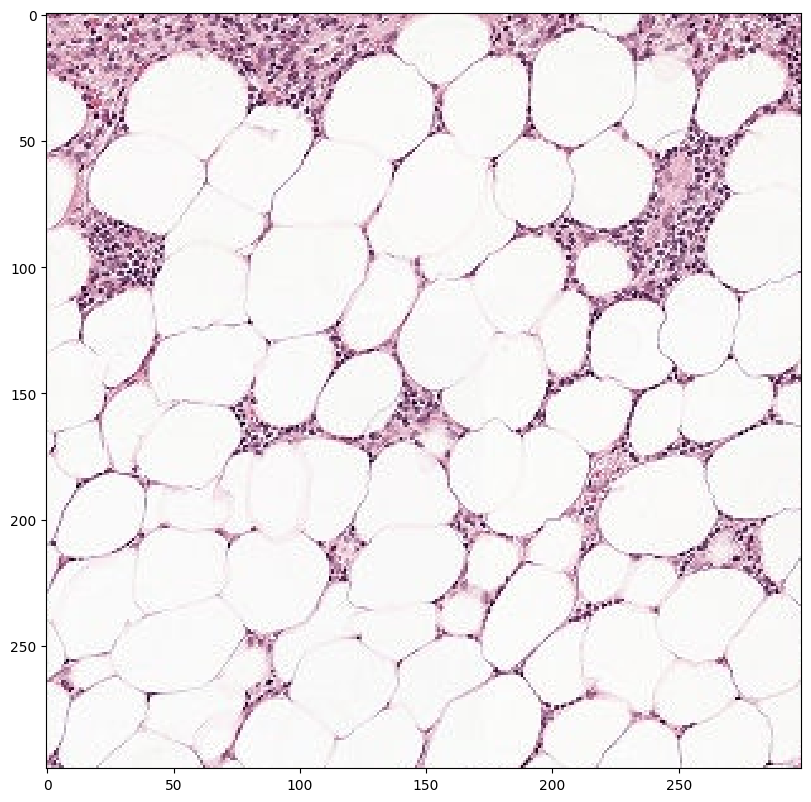

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(training_slides[200])


## Building the model using out of the box inception v3, added dropout and a single dense layer, as well as new sigmoid output layer

In [0]:
# conv_base = tf.keras.applications.inception_v3.InceptionV3(weights=None,include_top = False,input_shape=(75,75,3))
# model = models.Sequential()
# model.add(conv_base)
# model.add(layers.Flatten())
# model.add(layers.Dense(128, activation='relu'))
# model.add(layers.Dense(1, activation='sigmoid'))

In [0]:
base_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet', input_shape=(299,299,3))
base_model.trainable = False
CLASSES = 1
x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(x)
# x = tf.keras.layers.Dropout(0.4)(x)
x = Dense(128, activation = 'relu')(x)
predictions = Dense(CLASSES, activation='sigmoid')(x)
model = Model(inputs=base_model.input, outputs=predictions)

87916544/87910968 [==============================] - 3s 0us/step


In [0]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
______________________________________________________________________________________________

## Evaluation Metrics (F1, Precicion, Recall): 

*Sourced: https://datascience.stackexchange.com/questions/45165/how-to-get-accuracy-f1-precision-and-recall-for-a-keras-model

In [0]:
def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

## Used to later plot model training

In [0]:
def plot_metrics(history):
  colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
  metrics =  ['acc', 'f1_m', 'precision_m', 'recall_m']
  for n, metric in enumerate(metrics):
    name = metric.replace("_"," ").capitalize()
    plt.figure(figsize=(10,10), dpi=100)
    plt.subplot(2,2,n+1)
    plt.plot(history.epoch,  history.history[metric], color=colors[0], label='Train')
    plt.plot(history.epoch, history.history['val_'+metric],
             color=colors[0], linestyle="--", label='Val')
    plt.xlabel('Epoch')
    plt.ylabel(name)
    if metric == 'loss':
      plt.ylim([0, plt.ylim()[1]])
    elif metric == 'auc':
      plt.ylim([0.8,1])
    else:
      plt.ylim([0,1])

    plt.legend()

In [0]:
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['acc',f1_m,precision_m,recall_m])

In [0]:
model.fit(x = training_slides, y = training_labels, validation_data=(validation_slides, validation_labels), class_weight=class_weight , epochs=20)

Train on 7327 samples, validate on 1832 samples
Epoch 1/20
7327/7327 [==============================] - 35s 5ms/sample - loss: 0.4562 - acc: 0.7754 - f1_m: 0.4369 - precision_m: 0.3579 - recall_m: 0.7668 - val_loss: 22.0949 - val_acc: 0.8914 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00
Epoch 2/20
7327/7327 [==============================] - 23s 3ms/sample - loss: 0.3622 - acc: 0.8286 - f1_m: 0.5141 - precision_m: 0.4278 - recall_m: 0.8154 - val_loss: 20.9534 - val_acc: 0.8908 - val_f1_m: 0.0273 - val_precision_m: 0.0690 - val_recall_m: 0.0172
Epoch 3/20
7327/7327 [==============================] - 23s 3ms/sample - loss: 0.3397 - acc: 0.8347 - f1_m: 0.5278 - precision_m: 0.4302 - recall_m: 0.8462 - val_loss: 27.6526 - val_acc: 0.8914 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00
Epoch 4/20
7327/7327 [==============================] - 23s 3ms/sample - loss: 0.3228 - acc: 0.8477 - f1_m: 0.5385 - precision_m: 0.4359 - rec

In [0]:
base_model.trainable = True
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['acc',f1_m,precision_m,recall_m])
history = model.fit(x = training_slides, y = training_labels, validation_data=(validation_slides, validation_labels), class_weight=class_weight , epochs=20)

Train on 7327 samples, validate on 1832 samples
Epoch 1/20
7327/7327 [==============================] - 77s 10ms/sample - loss: 0.4252 - acc: 0.8426 - f1_m: 0.5339 - precision_m: 0.4686 - recall_m: 0.7771 - val_loss: 35.3627 - val_acc: 0.9531 - val_f1_m: 0.6527 - val_precision_m: 0.8050 - val_recall_m: 0.5888
Epoch 2/20
7327/7327 [==============================] - 61s 8ms/sample - loss: 0.3107 - acc: 0.8743 - f1_m: 0.6039 - precision_m: 0.5256 - recall_m: 0.8588 - val_loss: 0.2217 - val_acc: 0.9034 - val_f1_m: 0.6327 - val_precision_m: 0.5327 - val_recall_m: 0.8697
Epoch 3/20
7327/7327 [==============================] - 61s 8ms/sample - loss: 0.3357 - acc: 0.8869 - f1_m: 0.6240 - precision_m: 0.5512 - recall_m: 0.8667 - val_loss: 164028.9223 - val_acc: 0.1086 - val_f1_m: 0.1913 - val_precision_m: 0.1088 - val_recall_m: 0.9483
Epoch 4/20
7327/7327 [==============================] - 61s 8ms/sample - loss: 0.3557 - acc: 0.8609 - f1_m: 0.5719 - precision_m: 0.5061 - recall_m: 0.8337 - val_

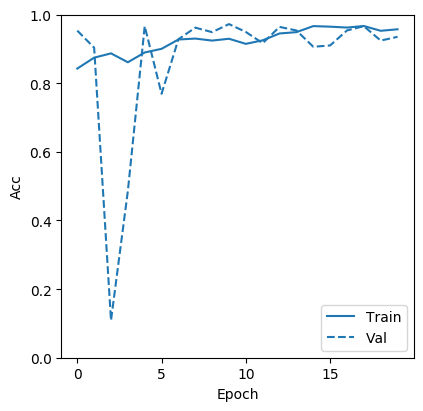

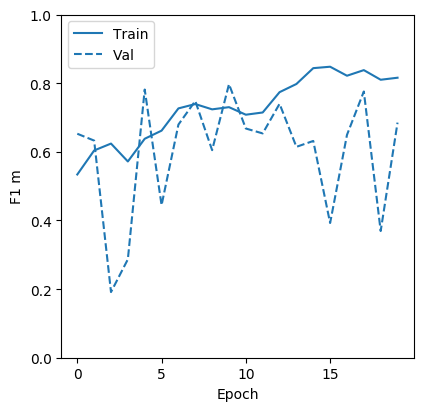

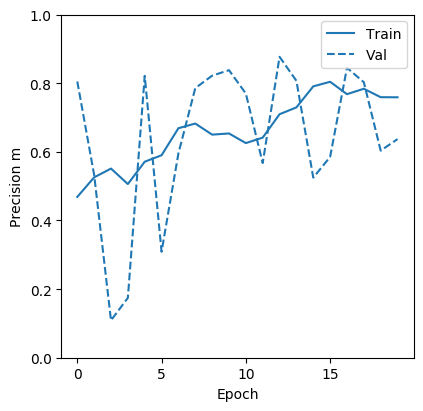

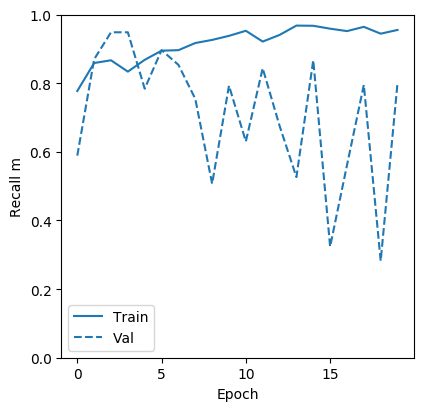

In [0]:
plot_metrics(history)

Loading the saved model (checkpoint)

In [0]:
model_name = 'model_z3.h5'
model_save_path = '/content/drive/My Drive/slid/%s' % model_name

In [0]:
dependencies = {
    'f1_m': f1_m,
    'recall_m' : recall_m,
    'precision_m' : precision_m
}

In [0]:
model = tf.keras.models.load_model(model_save_path, custom_objects=dependencies)

## Attempt prediction

The below are used to calculate metrics on our test images

In [0]:
def test_metrics(true_label, pred_label):
  def recall(true_label,pred_label):
    tp = np.sum(true_label*pred_label)
    total_pos = np.sum(true_label)
    rec = tp/(total_pos + 0.00001)
    return rec
  def precision(true_label, pred_label):
    tp = np.sum(true_label*pred_label)
    pred_pos = np.sum(pred_label)
    prec = tp/(pred_pos + 0.00001)
    return prec
  def f1(prec, rec):
    numa = prec*rec
    denom = prec + rec +0.00001
    f_1 = 2*(numa/denom)
    return f_1
  rec = recall(true_label,pred_label)
  prec = precision(true_label, pred_label)
  f_1 = f1(prec,rec)
  return f_1, rec, prec

## Prediction #1 image 091

In [0]:
test_image = '/content/drive/My Drive/slid/%s' % 'Copy of tumor_091.tif'
test_mask = '/content/drive/My Drive/slid/%s' % 'Copy of tumor_091_mask.tif'
test = [(test_image,test_mask)]

In [0]:
pred_slides, pred_masks, true_labels, x, y = create_windows(test,3,299, train=False)

In [0]:
pred_slides = np.array(pred_slides, dtype=np.float32)
true_labels = np.array(true_labels, dtype=np.float32)

In [0]:
pred = model.predict(pred_slides)

In [0]:
pred_probs = pred.reshape((pred.shape[0],))

In [0]:
pred_labels = (pred_probs > 0.5).astype(np.int)

In [0]:
def heatmap(pred,x,y,size): #takes the prediction probabilites that result from model.predict
  maps = np.zeros((x, y,3))
  p = 0
  c = 1
  for j in range(0,x,size):
    q = size*c
    for i in range(0,y,size):
      if pred[p][0] < .5:
        maps[j:q,i:size*c] = 0
      else:
        maps[j:q,i:size*c] = pred[p][0]
      c = c + 1
      p = p+1
  return maps

In [0]:
def heatmap(pred,x,y,size): #takes the prediction probabilites that result from model.predict
  maps = np.zeros((x, y,3))
  p = 0
  c = size
  q = size
  for j in range(0,x,size):
    #print(j)
    q = j + size
    for i in range(0,y,size):
      c = i + size
      if pred[p][0] >= .5:
        maps[j:q,i:c] = pred[p][0]  
      p = p+1
  return maps

In [0]:
maps = heatmap(pred,x,y,299)

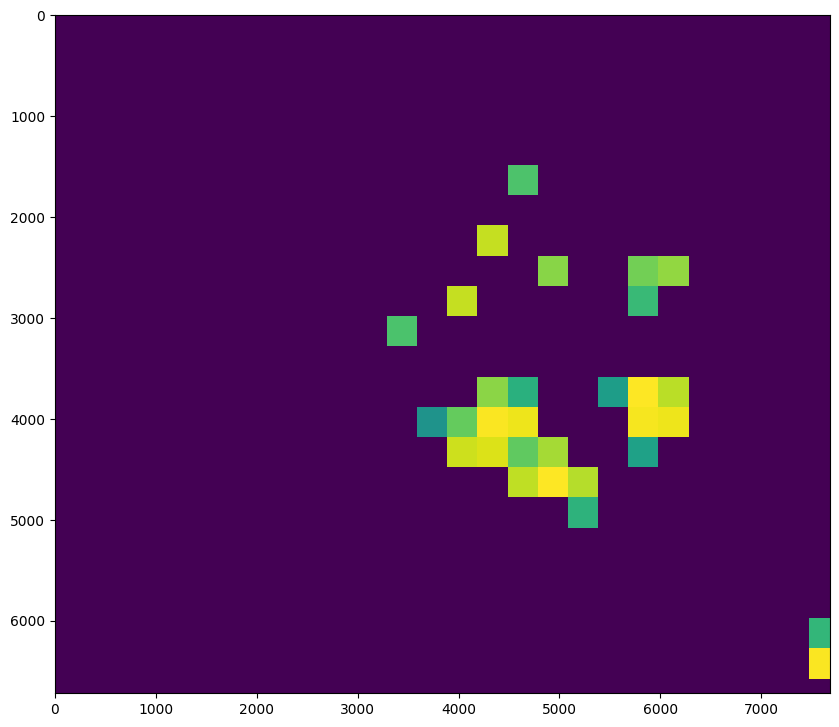

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps[:,:,0])

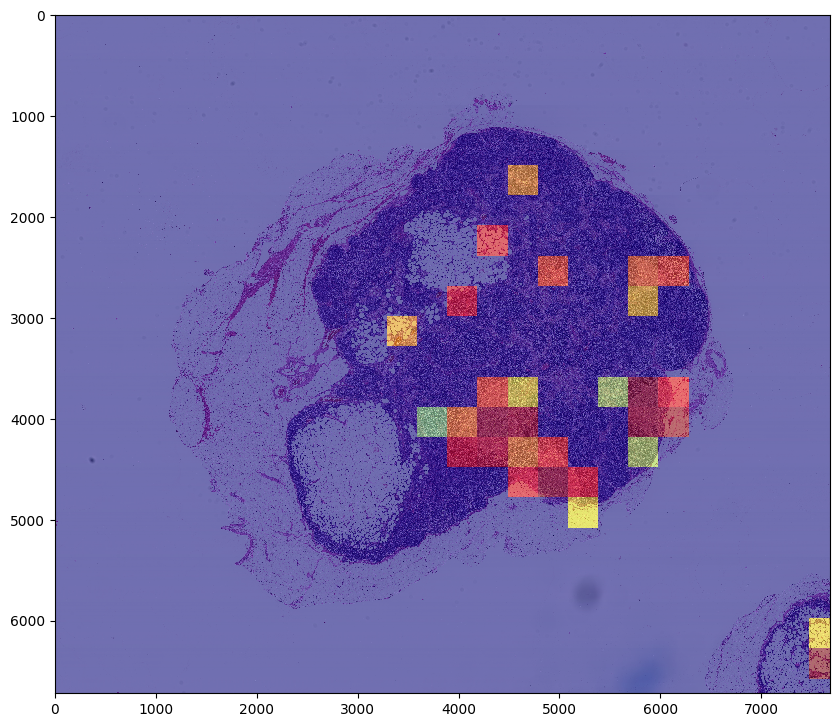

In [0]:
slide_image = open_slide(test_image)
image_window = read_slide(slide_image,0,0,level = 3, width = y,height = x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels,pred_labels)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.7719245675915414
recall:  0.8148145130316619
precision:  0.7333330888889704


## Prediction 1 Ground Truth

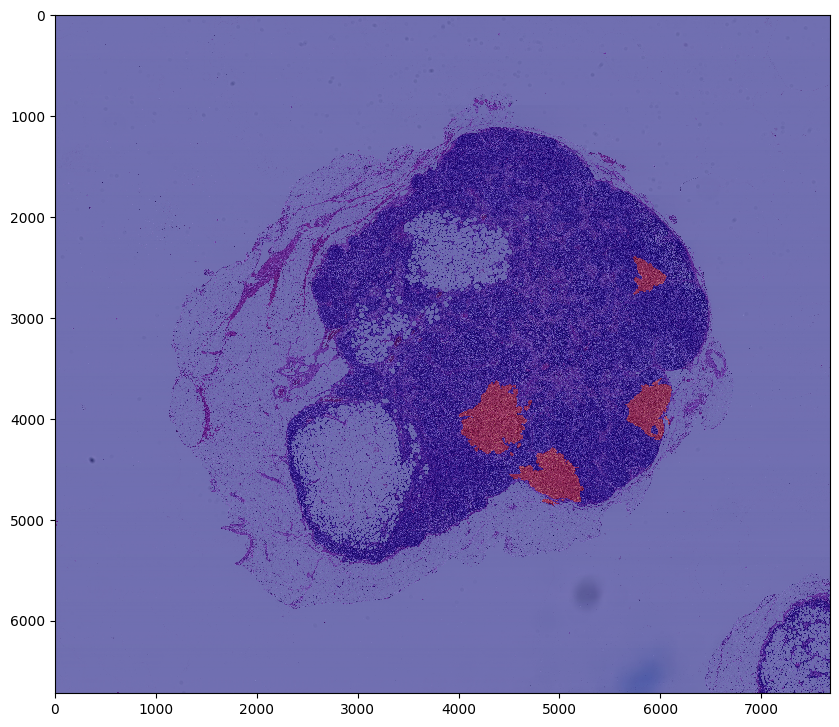

In [0]:
slide_image = open_slide(test[0][0])
image_window = read_slide(slide_image,0,0,level = 3, width = slide_image.level_dimensions[3][0],height = slide_image.level_dimensions[3][1])
tumor_mask = open_slide(test[0][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=3, width=slide_image.level_dimensions[3][0], height=slide_image.level_dimensions[3][1])
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)

## Prediction #2 image 101



In [0]:
testing_slide_paths[0]

('/content/drive/My Drive/slid/Copy of tumor_101.tif',
 '/content/drive/My Drive/slid/Copy of tumor_101_mask.tif')

In [0]:
pred_slides, pred_masks, true_labels, x, y = create_windows([testing_slide_paths[0]],3,299, train=False)

In [0]:
pred_slides = np.array(pred_slides, dtype=np.float32)
true_labels = np.array(true_labels, dtype=np.float32)

In [0]:
pred = model.predict(pred_slides)

In [0]:
pred_probs = pred.reshape((pred.shape[0],))

In [0]:
pred_labels = (pred_probs > 0.5).astype(np.int)

In [0]:
maps = heatmap(pred,x,y,299)

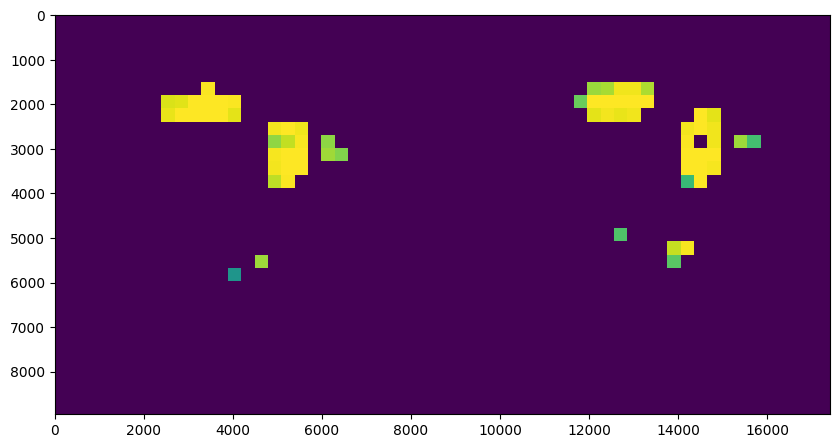

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps[:,:,0])

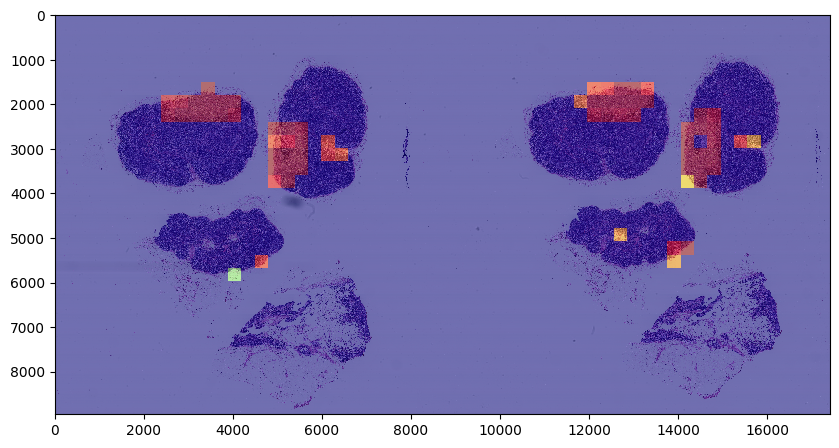

In [0]:
slide_image = open_slide(testing_slide_paths[0][0])
image_window = read_slide(slide_image,0,0,level = 3, width = y,height = x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels,pred_labels)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.8799949262501424
recall:  0.8048779506246402
precision:  0.9705880925605745


## Prediction 2 ground truth

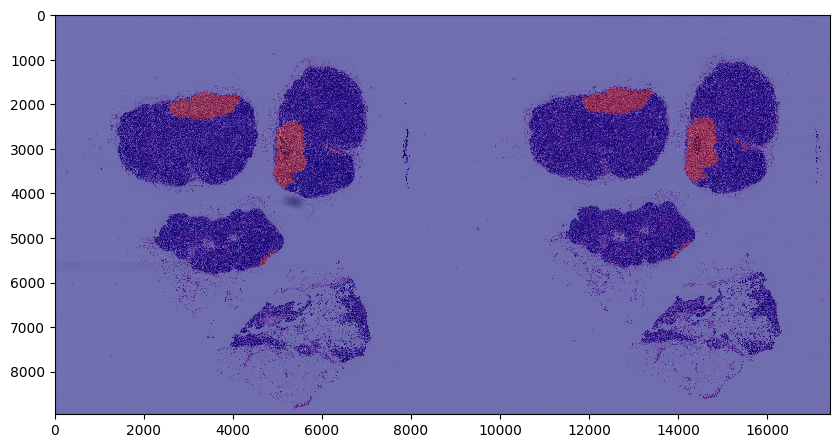

In [0]:
slide_image = open_slide(testing_slide_paths[0][0])
image_window = read_slide(slide_image,0,0,level = 3, width = y,height = x)
tumor_mask = open_slide(testing_slide_paths[0][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=3, width=y, height=x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)

## Prediction #3 image 081

In [0]:
testing_slide_paths[1]

('/content/drive/My Drive/slid/Copy of tumor_081.tif',
 '/content/drive/My Drive/slid/Copy of tumor_081_mask.tif')

In [0]:
pred_slides, pred_masks, true_labels, x, y = create_windows([testing_slide_paths[1]],3,299, train=False)

In [0]:
pred_slides = np.array(pred_slides, dtype=np.float32)
true_labels = np.array(true_labels, dtype=np.float32)

In [0]:
pred = model.predict(pred_slides)

In [0]:
pred_probs = pred.reshape((pred.shape[0],))

In [0]:
pred_labels = (pred_probs > 0.5).astype(np.int)

In [0]:
maps = heatmap(pred,x,y,299)

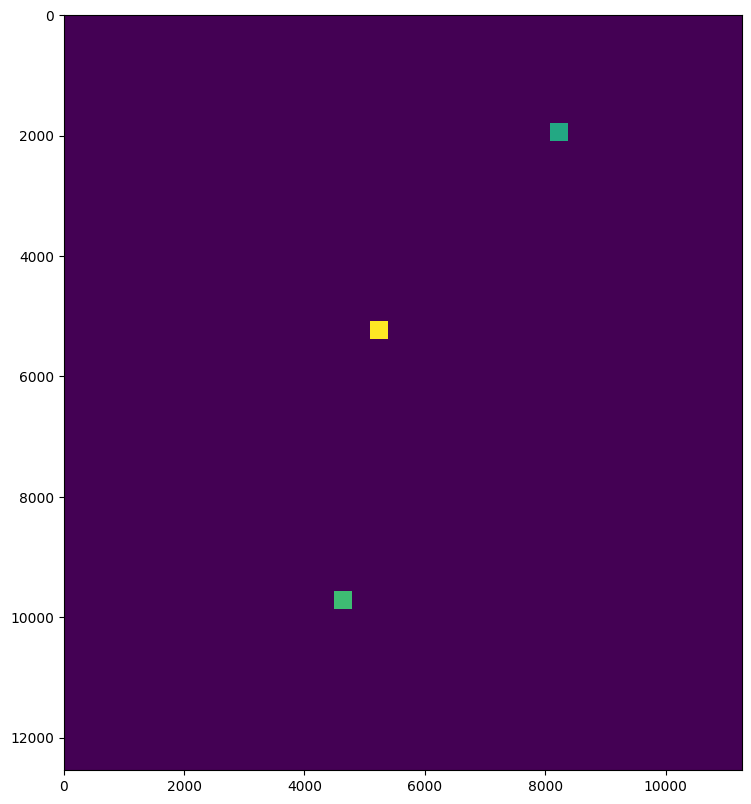

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps[:,:,0])

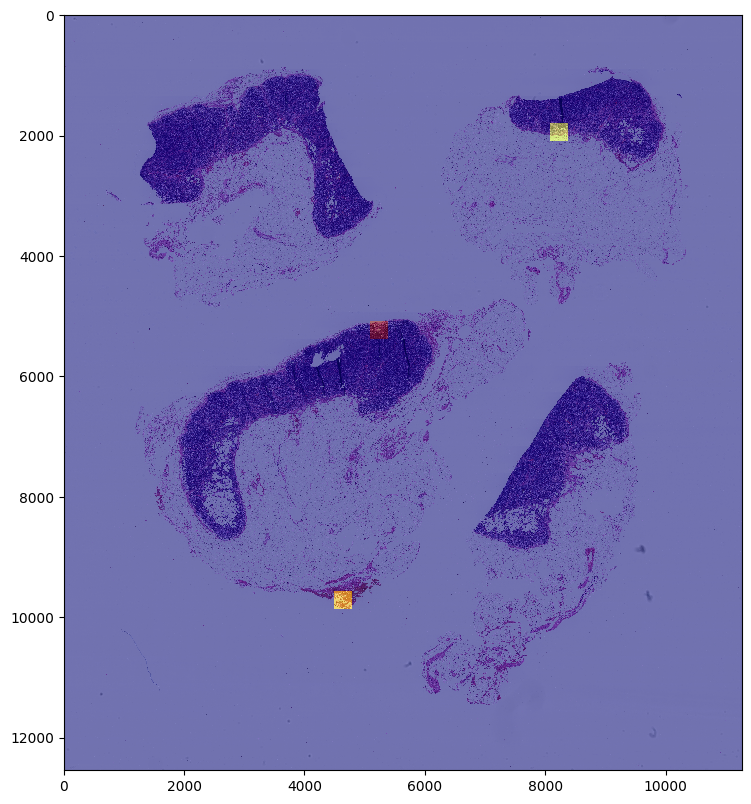

In [0]:
slide_image = open_slide(testing_slide_paths[1][0])
image_window = read_slide(slide_image,0,0,level = 3, width = y,height = x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels,pred_labels)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.4999937500281251
recall:  0.9999900000999989
precision:  0.3333322222259259


## Prediction 3 ground truth

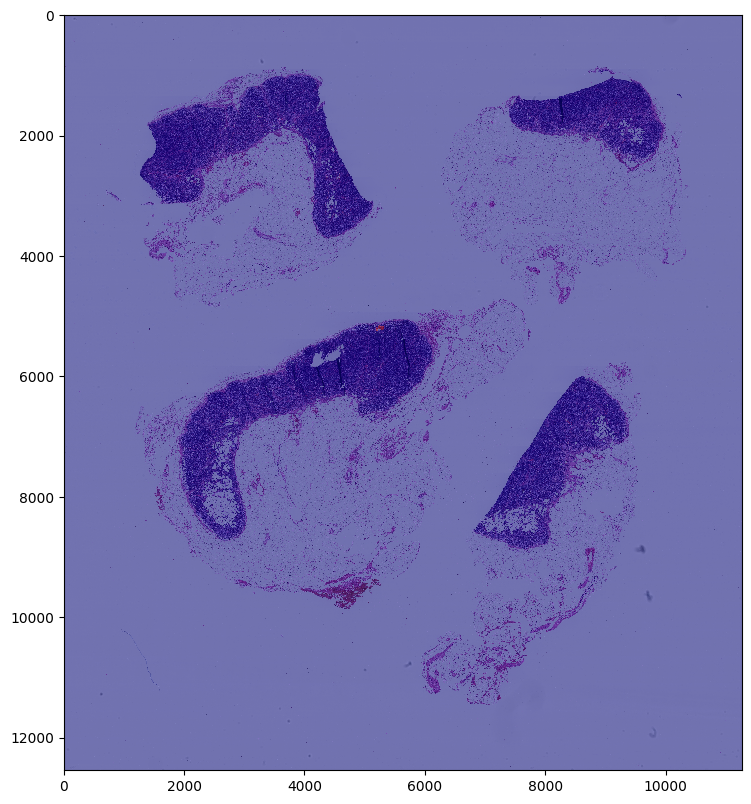

In [0]:
slide_image = open_slide(testing_slide_paths[1][0])
image_window = read_slide(slide_image,0,0,level = 3, width = y,height = x)
tumor_mask = open_slide(testing_slide_paths[1][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=3, width=y, height=x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)

## Save the model

In [0]:
model_name = 'model_z3.h5'
model_save_path = '/content/drive/My Drive/slid/%s' % model_name
model.save(model_save_path)

## Building a second model for ensemble (level 1)

reducing training images from 18 to 7 due to ram constraints, this should be immaterial since the resolution of the images in the second model will be magnitudes greater than the prior model

In [0]:
# random.shuffle(training_slide_paths)
# training_slide_paths = training_slide_paths[]

In [0]:
training_slides, training_masks, training_labels = create_windows(training_slide_paths,2,299, train = True)

In [0]:
len(training_slides)

30374

In [0]:
training_slides = np.array(training_slides)
training_masks = np.array(training_masks)
training_labels = np.array(training_labels)

In [0]:
training_slides, validation_slides, training_labels, validation_labels = train_test_split(training_slides, training_labels, stratify=training_labels, test_size=0.2)

In [0]:
len(training_slides)

24299

In [0]:
len(validation_slides)

6075

In [0]:
training_slides = np.array(training_slides)
training_labels = np.array(training_labels)
validation_slides = np.array(validation_slides)
validation_labels = np.array(validation_labels)

## Ratio of cancer images at level 1

In [0]:
noncancer_indexes = np.where(training_labels == 0.0)[0]
cancer_indexes = np.where(training_labels == 1.0)[0]
noncancer = len(noncancer_indexes)
cancer = len(cancer_indexes)
ratio = cancer/(noncancer)
total = noncancer + cancer
ratio

0.11391766755294765

## New weights to handle class unbalance

In [0]:
weight_for_0 = (1 / noncancer)*(total)/2.0 
weight_for_1 = (1 / cancer)*(total)/2.0

class_weight = {0: weight_for_0, 1: weight_for_1}

## Model 2

In [0]:
# model2 = Sequential()
# model2.add(Conv2D(6, kernel_size=(5, 5), strides=(1, 1), activation='relu', input_shape=(299,299,3), padding="same"))
# model2.add(AveragePooling2D(pool_size=(2, 2), strides=(1, 1), padding='valid'))
# model2.add(Conv2D(16, kernel_size=(5, 5), strides=(1, 1), activation='relu', padding='valid'))
# model2.add(AveragePooling2D(pool_size=(2, 2), strides=(2, 2), padding='valid'))
# model2.add(Conv2D(120, kernel_size=(5, 5), strides=(1, 1), activation='relu', padding='valid'))
# model2.add(Flatten())
# model2.add(Dense(128,activation='relu'))
# model2.add(Dense(64,activation='relu'))
# # Lets add softmax activated neurons as much as number of classes
# model2.add(Dense(1, activation = 'sigmoid'))

In [0]:
# model2 = Sequential()

# # Add convolutional layer consisting of 32 filters and shape of 3x3 with ReLU activation
# # We want to preserve more information for following layers so we use padding
# # 'Same' padding tries to pad evenly left and right, 
# # but if the amount of columns to be added is odd, it will add the extra column to the right
# model2.add(Conv2D(32, kernel_size = (3,3), activation='relu', input_shape = (299,299,3)))
# model2.add(BatchNormalization())
# model2.add(Conv2D(32, kernel_size = (3,3), activation='relu'))
# model2.add(BatchNormalization())

# # Add convolutional layer consisting of 32 filters and shape of 5x5 with ReLU activation
# # We give strides=2 for space between each sample on the pixel grid
# model2.add(Conv2D(32, kernel_size = (5,5), strides=2, padding='same', activation='relu'))
# model2.add(BatchNormalization())
# # Dropping %40 of neurons
# model2.add(Dropout(0.4))

# model2.add(Conv2D(64, kernel_size = (3,3), activation='relu'))
# model2.add(BatchNormalization())
# model2.add(Conv2D(64, kernel_size = (3,3), activation='relu'))
# model2.add(BatchNormalization())
# model2.add(Conv2D(64, kernel_size = (5,5), strides=2, padding='same', activation='relu'))
# model2.add(BatchNormalization())
# model2.add(Dropout(0.4))

# model2.add(Conv2D(128, kernel_size = 4, activation='relu'))
# model2.add(BatchNormalization())
# # To be able to merge into fully connected layer we have to flatten
# model2.add(Flatten())
# model2.add(Dense(128,activation='relu'))
# model2.add(Dense(64,activation='relu'))
# # Lets add softmax activated neurons as much as number of classes
# model2.add(Dense(1, activation = 'sigmoid'))

In [0]:
base_model2 = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet', input_shape=(299,299,3))
base_model2.trainable = False
CLASSES = 1
z = base_model2.output
z = tf.keras.layers.GlobalAveragePooling2D(name='avg_pool')(z)
z = Dense(128, activation = 'relu')(z)
predictions2 = Dense(CLASSES, activation='sigmoid')(z)
model2 = Model(inputs=base_model2.input, outputs=predictions2)

87916544/87910968 [==============================] - 6s 0us/step


In [0]:
model2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['acc',f1_m,precision_m,recall_m])

In [0]:
model2.fit(x = training_slides, y = training_labels, validation_data=(validation_slides, validation_labels), class_weight=class_weight , epochs=20)

Train on 24299 samples, validate on 6075 samples
Epoch 1/20
24299/24299 [==============================] - 86s 4ms/sample - loss: 0.3349 - acc: 0.8683 - f1_m: 0.5651 - precision_m: 0.4942 - recall_m: 0.8168 - val_loss: 56.8317 - val_acc: 0.8978 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00
Epoch 2/20
24299/24299 [==============================] - 74s 3ms/sample - loss: 0.2861 - acc: 0.8925 - f1_m: 0.6070 - precision_m: 0.5347 - recall_m: 0.8337 - val_loss: 51.0434 - val_acc: 0.8978 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00
Epoch 3/20
24299/24299 [==============================] - 74s 3ms/sample - loss: 0.2702 - acc: 0.9002 - f1_m: 0.6323 - precision_m: 0.5628 - recall_m: 0.8622 - val_loss: 50.1095 - val_acc: 0.8978 - val_f1_m: 0.0000e+00 - val_precision_m: 0.0000e+00 - val_recall_m: 0.0000e+00
Epoch 4/20
24299/24299 [==============================] - 74s 3ms/sample - loss: 0.2725 - acc: 0.8995 - f1_m: 0.6281 - prec

## Allow the Inception layers to learn

In [0]:
base_model2.trainable = True
model2.compile(loss='binary_crossentropy',optimizer='adam',metrics=['acc',f1_m,precision_m,recall_m])
history2 = model2.fit(x = training_slides, y = training_labels, validation_data=(validation_slides, validation_labels), class_weight=class_weight , epochs=20)

Train on 24299 samples, validate on 6075 samples
Epoch 1/20
24299/24299 [==============================] - 214s 9ms/sample - loss: 0.3634 - acc: 0.9072 - f1_m: 0.6466 - precision_m: 0.6078 - recall_m: 0.8282 - val_loss: 0.6581 - val_acc: 0.7980 - val_f1_m: 0.2265 - val_precision_m: 0.1973 - val_recall_m: 0.3234
Epoch 2/20
24299/24299 [==============================] - 201s 8ms/sample - loss: 0.2638 - acc: 0.9153 - f1_m: 0.6733 - precision_m: 0.6166 - recall_m: 0.8658 - val_loss: 0.3482 - val_acc: 0.9684 - val_f1_m: 0.7688 - val_precision_m: 0.8877 - val_recall_m: 0.7077
Epoch 3/20
24299/24299 [==============================] - 201s 8ms/sample - loss: 0.2370 - acc: 0.9220 - f1_m: 0.6977 - precision_m: 0.6387 - recall_m: 0.8896 - val_loss: 0.1891 - val_acc: 0.9793 - val_f1_m: 0.8402 - val_precision_m: 0.8748 - val_recall_m: 0.8383
Epoch 4/20
24299/24299 [==============================] - 201s 8ms/sample - loss: 0.1893 - acc: 0.9432 - f1_m: 0.7587 - precision_m: 0.7150 - recall_m: 0.8972 

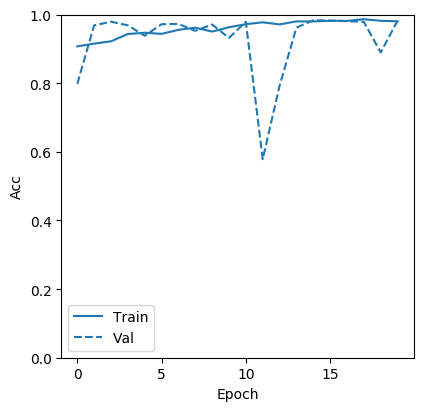

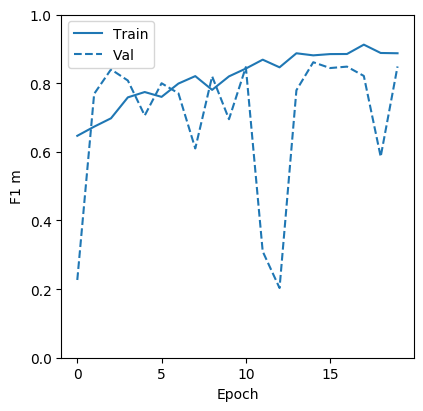

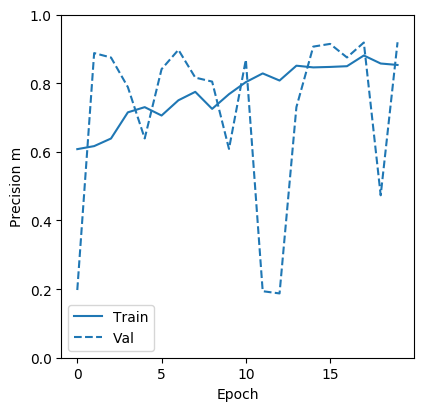

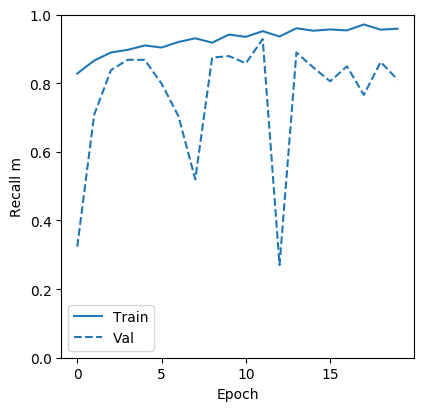

In [0]:
plot_metrics(history2)

In [0]:
model_name = 'model_z2.h5'
model_save_path = '/content/drive/My Drive/slid/%s' % model_name
#model2.save(model_save_path)

In [0]:
model2 = tf.keras.models.load_model(model_save_path, custom_objects=dependencies)

## Generate a heatmap on image 091 using the model trained at level 2

In [0]:
pred_slides2, pred_masks2, true_labels2, x2, y2 = create_windows(test,2,299, train=False)

In [0]:
pred_slides2 = np.array(pred_slides2, dtype=np.float32)
true_labels2 = np.array(true_labels2, dtype=np.float32)

In [0]:
pred2 = model2.predict(pred_slides2)

In [0]:
pred_probs2 = pred2.reshape((pred2.shape[0],))

In [0]:
pred_labels2 = (pred_probs2 > 0.5).astype(np.int)

In [0]:
maps2 = heatmap(pred2,x2,y2,299)

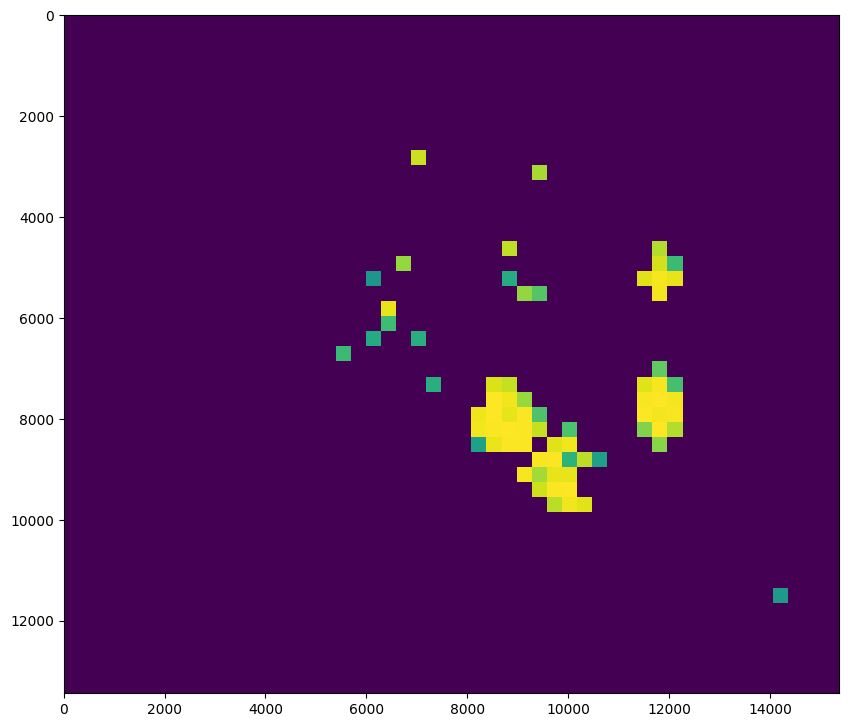

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps2[:,:,0])

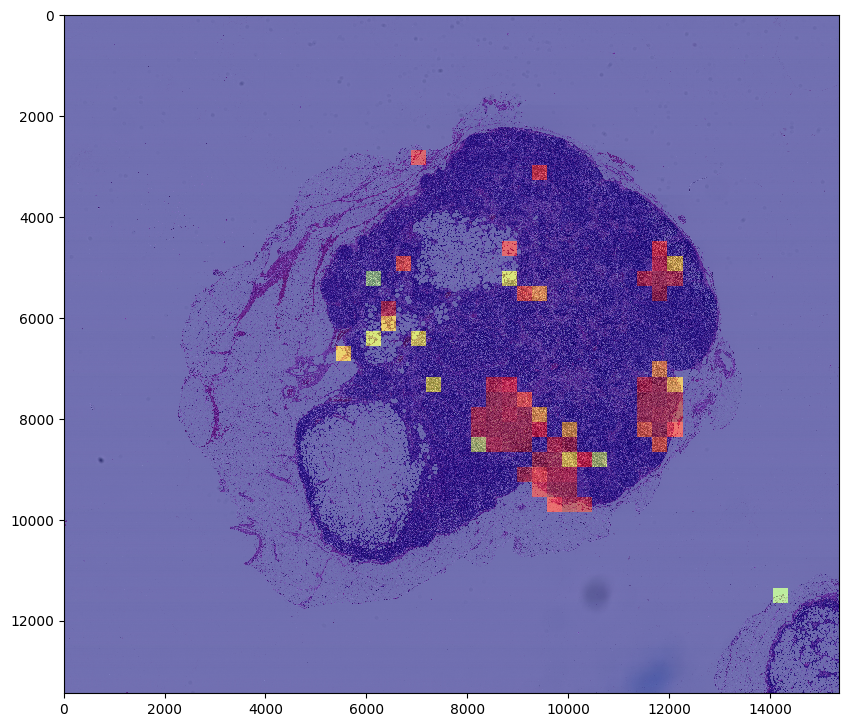

In [0]:
slide_image = open_slide(test_image)
image_window = read_slide(slide_image,0,0,level = 2, width = y2,height = x2)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps2[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels2,pred_labels2)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.7499948968311738
recall:  0.7605632731601023
precision:  0.7397259260649416


## Prediction 1 Ground Truth

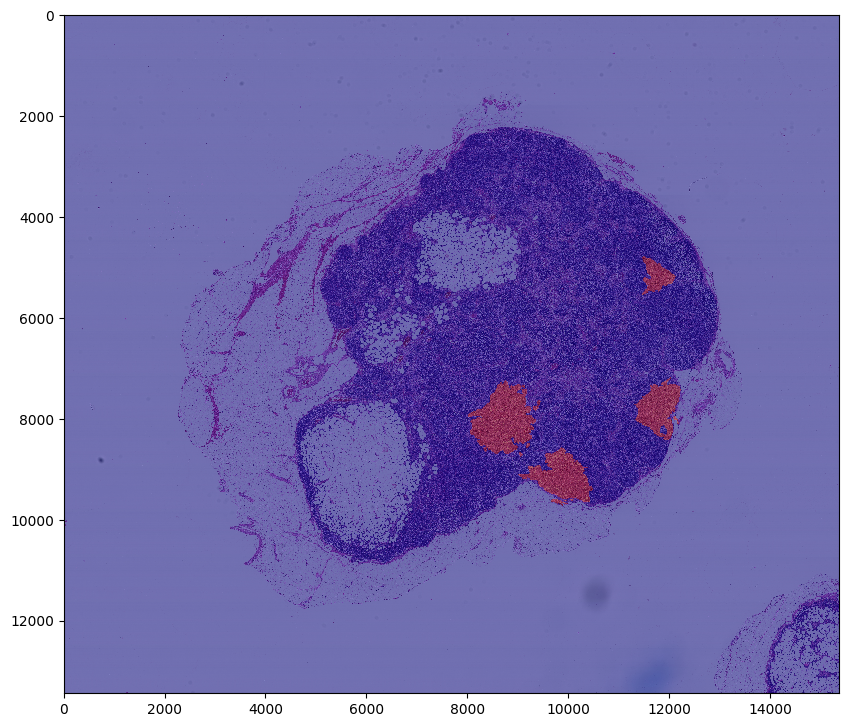

In [0]:
slide_image = open_slide(test[0][0])
image_window = read_slide(slide_image,0,0,level = 2, width = slide_image.level_dimensions[2][0],height = slide_image.level_dimensions[2][1])
tumor_mask = open_slide(test[0][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=2, width=slide_image.level_dimensions[2][0], height=slide_image.level_dimensions[2][1])
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)

## Prediction #2 image 101

In [0]:
testing_slide_paths[0]

('/content/drive/My Drive/slid/Copy of tumor_101.tif',
 '/content/drive/My Drive/slid/Copy of tumor_101_mask.tif')

In [0]:
pred_slides, pred_masks, true_labels, x, y = create_windows([testing_slide_paths[0]],2,299, train=False)

In [0]:

pred_slides.shape

(3600, 299, 299, 3)

In [0]:
x

17920

In [0]:
y

34816

In [0]:
pred_slides = np.array(pred_slides, dtype=np.float32)
true_labels = np.array(true_labels, dtype=np.float32)

In [0]:
pred = model2.predict(pred_slides)

In [0]:
len(pred)

3600

In [0]:
 #takes the prediction probabilites that result from model.predict
maps = np.memmap('prediction2.mymemmap',dtype='float32',mode='w+', shape=(x,17920,3))
p = 0
size = 299
c = size
q = size
for j in range(0,x,size):
  #print(j)
  q = j + size
  for i in range(0,17920,size):
    c = i + size
    if pred[p][0] >= .5:
      maps[j:q,i:c] = pred[p][0]  
    p = p+1


In [0]:
pred_probs = pred.reshape((pred.shape[0],))

In [0]:
pred_labels = (pred_probs > 0.5).astype(np.int)

In [0]:
maps = heatmap(pred,x,y,299)

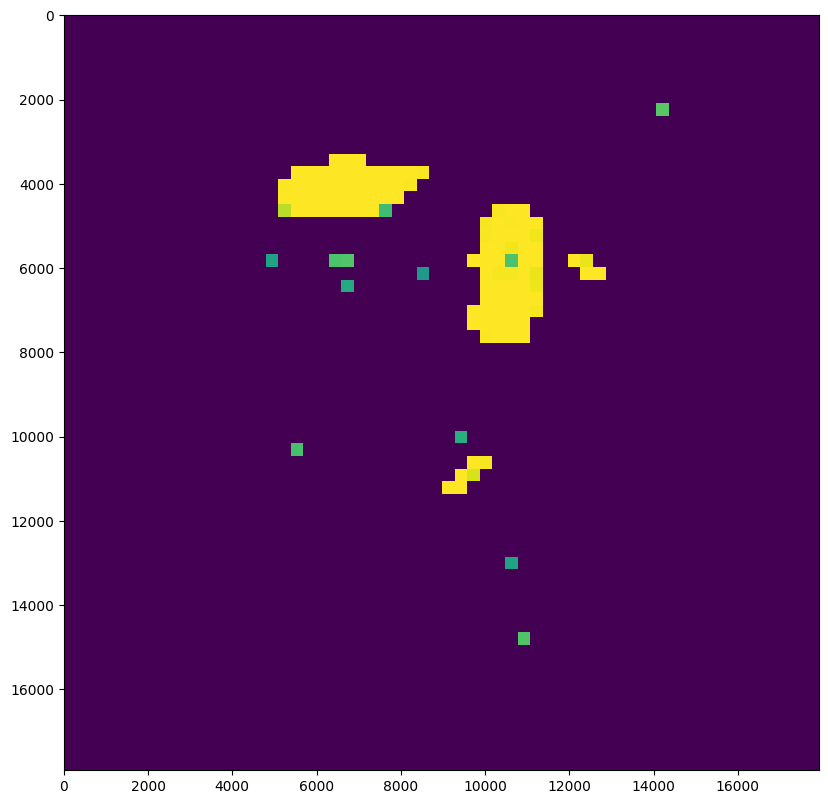

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps[:,:,0])

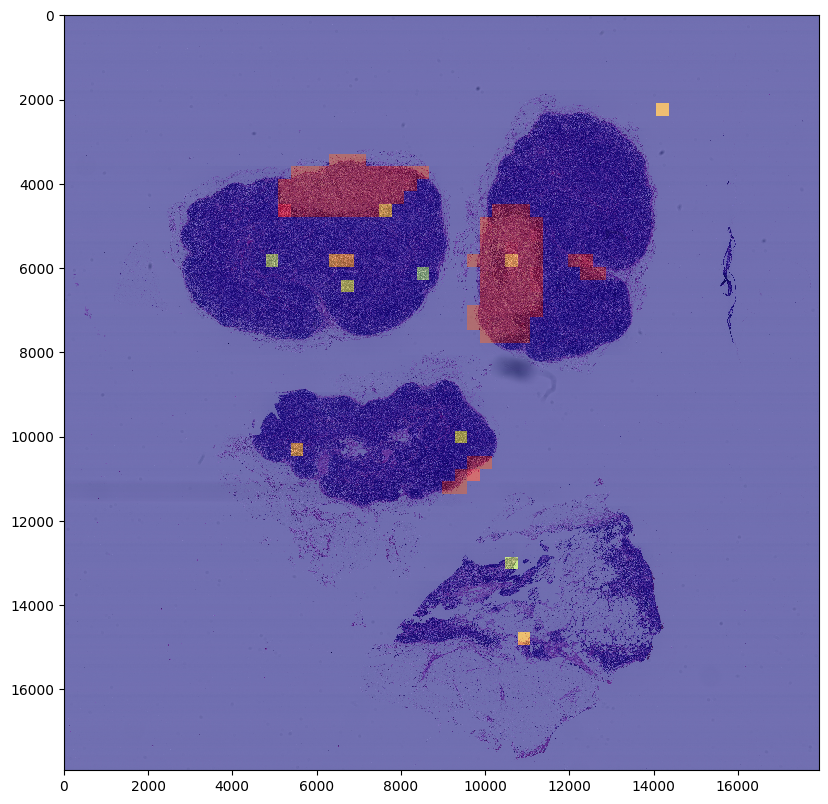

In [0]:
slide_image = open_slide(testing_slide_paths[0][0])
image_window = read_slide(slide_image,0,0,level = 2, width = 17920,height = slide_image.level_dimensions[2][1] )
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels,pred_labels)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.9432263633681215
recall:  0.972972885317758
precision:  0.9152541597242237


## Prediction 2 Ground Truth (@level 2)

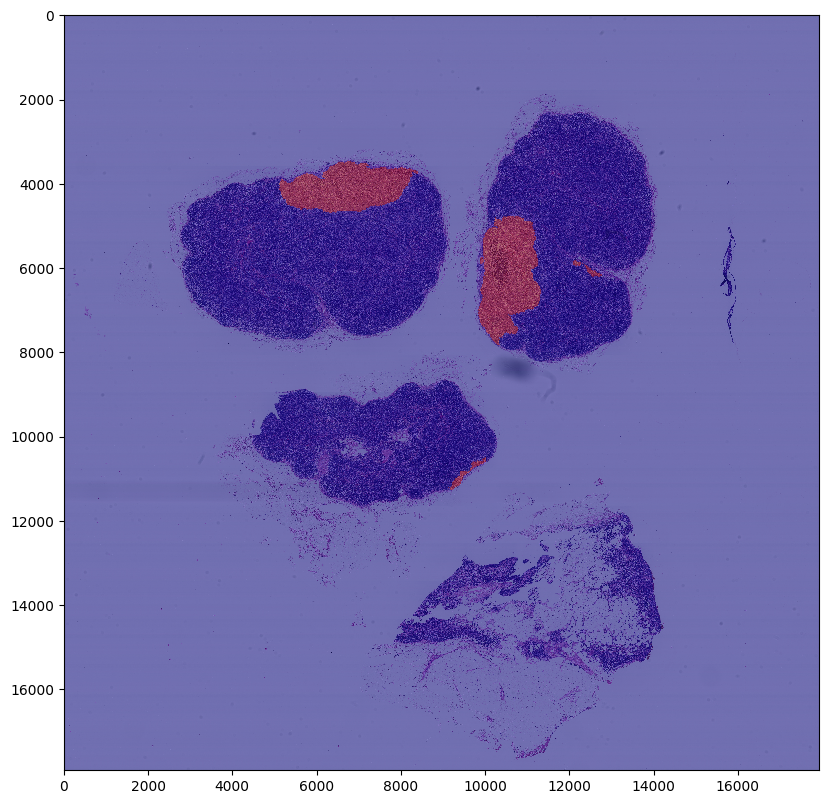

In [0]:
slide_image = open_slide(testing_slide_paths[0][0])
image_window = read_slide(slide_image,0,0,level = 2, width = 17920,height = x)
tumor_mask = open_slide(testing_slide_paths[0][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=2, width=17920, height=x)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)

## Prediction # 3 image 081

In [0]:
testing_slide_paths[1]

('/content/drive/My Drive/slid/Copy of tumor_081.tif',
 '/content/drive/My Drive/slid/Copy of tumor_081_mask.tif')

In [0]:
pred_slides, pred_masks, true_labels, x, y = create_windows([testing_slide_paths[1]],2,299, train=False)

In [0]:
pred_slides = np.array(pred_slides, dtype=np.float32)
true_labels = np.array(true_labels, dtype=np.float32)

In [0]:
pred = model2.predict(pred_slides)

In [0]:
 #takes the prediction probabilites that result from model.predict
maps = np.memmap('prediction3.mymemmap',dtype='float32',mode='w+', shape=(22200,22000,3))
p = 0
size = 299
c = size
q = size
for j in range(0,22200,size):
  #print(j)
  q = j + size
  for i in range(0,22000,size):
    c = i + size
    if pred[p][0] >= .5:
      maps[j:q,i:c] = pred[p][0]  
    p = p+1


In [0]:
pred_probs = pred.reshape((pred.shape[0],))

In [0]:
pred_labels = (pred_probs > 0.5).astype(np.int)

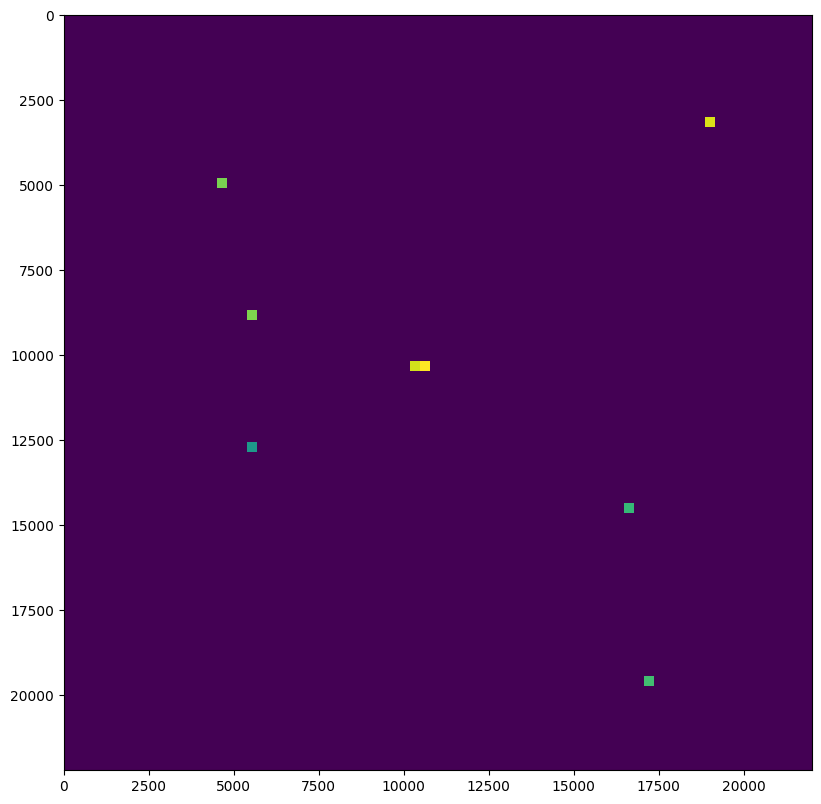

In [0]:
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(maps[:,:,0])

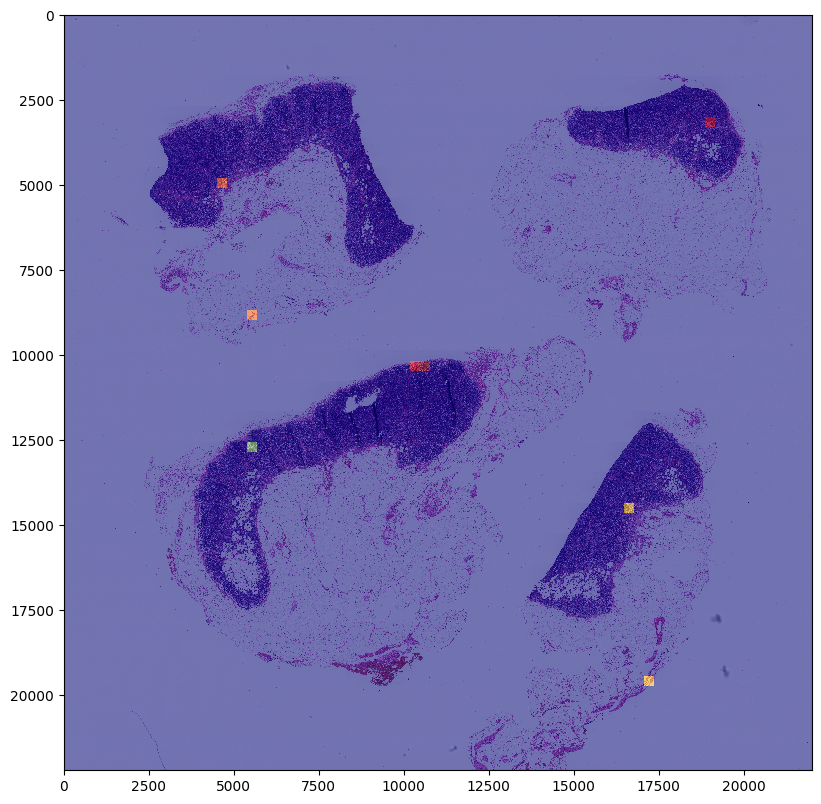

In [0]:
slide_image = open_slide(testing_slide_paths[1][0])
image_window = read_slide(slide_image,0,0,level = 2, width = 22000,height = 22200 )
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(maps[:,:,0], cmap='jet', alpha=0.5)

In [0]:
f, rec, prec = test_metrics(true_labels,pred_labels)
print('f1: ',f)
print('recall: ',rec)
print('precision: ',prec)

f1:  0.3636317355779111
recall:  0.6666644444518518
precision:  0.24999968750039064


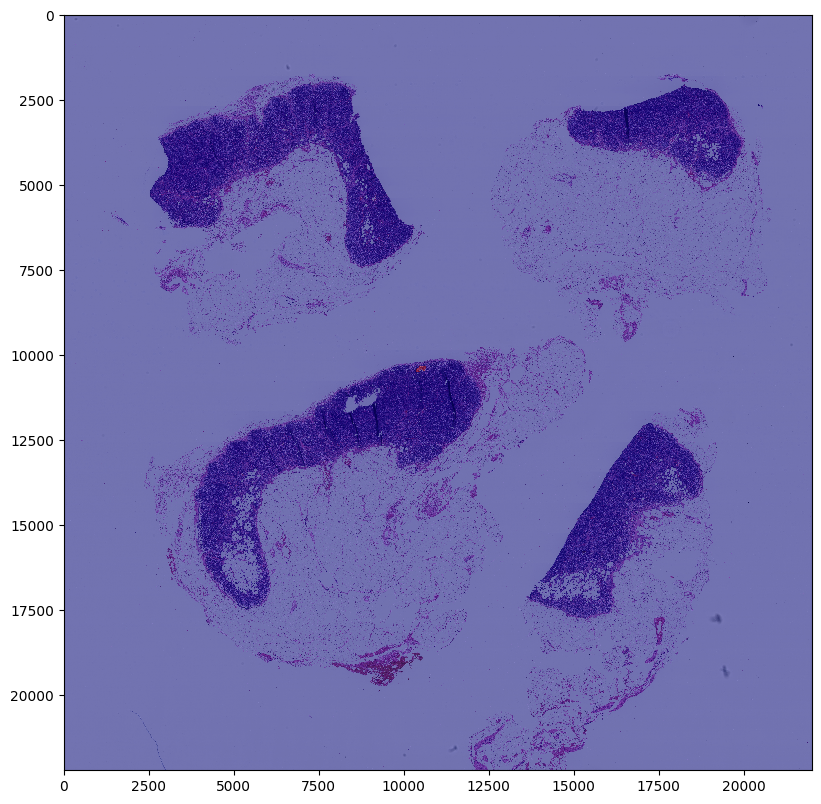

In [0]:
slide_image = open_slide(testing_slide_paths[1][0])
image_window = read_slide(slide_image,0,0,level = 2, width = 22000,height = 22200)
tumor_mask = open_slide(testing_slide_paths[1][1])
mask_image = read_slide(tumor_mask, x=0, y=0, level=2, width=22000, height=22200)
plt.figure(figsize=(10,10), dpi=100)
plt.imshow(image_window)
plt.imshow(mask_image[:,:,0], cmap='jet', alpha=0.5)